### **Neuronska mreza od 4 sloja (input, hidden(1), hidden(2), output)** (4 layer perceptron)

**Predmet: Duboke neuronske mreze**

_Luka Jasovic 2025430016_

#### Ciljevi:

1) Razumevanje nacina na koji neuronska mreza propagira informaciju od ulaznog do izlaznog sloja

2) Razumevanje i implementacija forward propagation algoritma, kao i nacina na koji slojevi inicijalizuju svoje koeficijente

3) Obnavljanje i primena parcijalnih derivacija pri racunanju gradijenata radi optimizacije _cost funkcije_ (__Binary cross entropy__ u ovom slucaju za binarnu klasifikaciju)

4) Praćenje promene cost funkcije, izbor najboljih ažuriranih koeficijenata i testiranje mreže na validacionom skupu

6) Primena na datasetu: "Coffee roast" sa kaggle-a. (https://www.kaggle.com/datasets/youssefahmed2612/coffee-roasting)
---
    Literatura koriscenja tokom izrade koda i ucenja:

1) https://deeplearningwithpython.io/ (Deep Learning With Python - by  François Chollet)
2) https://mml-book.github.io/ (Mathematics for Machine Learning - primarno za matricne operacije i tenzore)
3) Prezentacije predmeta Duboke Neuronske Mreze
---



#### **Dodatne stvari u odnosu na prethodnu verziju**:

1) Xavier/Glorot skaliranje W tezine (std=0.05 je uklonjena jer su tezine bile veoma male, jako blizu nuli)

2) Skaliranje X trening set-a rucno implementiranim StandardScaler-om, koji sam uveo iz _luka-plugins.py_ fajla

3) Dodatno ciscenje nepotrebnih redudantnih objekata (Npr. self.A_in i self.storage({'A_in':A_in}) i slicno - bilo ih je na vise mesta u kodu)

4) "Early stopping"- kriterijum pri treniranju za smanjenje vremena komputacije ukoliko nema znacajnog smanjenja Cost funkcije

5) Konstruisan model.predict(X_test) - predvidja verovatnocu klasa - Posto sve cuvam u slojevima, samo je vracen model.flow(ulazni podaci)

6) Uporedjen je trenutni model sa jednostavnijim modelom (1 skriveni sloj) kao i jednostavnom logistickom regresijom

7) Na samom kraju ovog fajla dodat je deo o uocenim problemima i optimizaciji istih kao i svoj zakljucak za ovaj projekat

---

In [1893]:
import os
import numpy as np
import pathlib
from pathlib import Path
import pandas as pd
import math
import matplotlib.pyplot as plt


In [1894]:
import utils.luka_plugins as lp

In [1895]:
scaler = lp.Scaler()

#### Load "coffee roast.csv"

In [1896]:
current_directory = os.getcwd()
filename = 'CoffeeRoasting.csv'
file_path = os.path.join(current_directory,filename) 

Za svoju masinu, samo cu staviti u string sve vezano za trazenje foldera i konstruisanje putanje.

In [1897]:
"""
for root,dirs,files in os.walk(current_directory):
    for dir in dirs:
        if dir =='Datasets'.casefold() or dir =='dataset':
            print(f'Dir. found')
"""

"\nfor root,dirs,files in os.walk(current_directory):\n    for dir in dirs:\n        if dir =='Datasets'.casefold() or dir =='dataset':\n            print(f'Dir. found')\n"

In [1898]:
"""
parent_directory = Path(current_directory).parent
print(parent_directory)

# traverse

for root,dirs,files in os.walk(parent_directory):
    for dir in dirs:
        if dir.startswith('datasets'):
            dir_path = os.path.join(root,dir)
            for file in os.listdir(dir_path):
                if file.startswith('Coffe'):
                    file_path = os.path.join(dir_path,file)
"""

"\nparent_directory = Path(current_directory).parent\nprint(parent_directory)\n\n# traverse\n\nfor root,dirs,files in os.walk(parent_directory):\n    for dir in dirs:\n        if dir.startswith('datasets'):\n            dir_path = os.path.join(root,dir)\n            for file in os.listdir(dir_path):\n                if file.startswith('Coffe'):\n                    file_path = os.path.join(dir_path,file)\n"

In [1899]:
# Helper functions

def to_numpy(non_array):
    print(non_array.shape)
    return non_array.to_numpy()

def check_shape(input_data):
    if len(input_data.shape)!=2:
        print(f"Expected 2D, got {len(input_data.shape)}D")

def check_y_shape(y):
    if y.ndim ==1:
        y = y.reshape(y.shape[0],1)
    return y

class Cost:
    def get_cost(self,A,y):
        L = -(y*np.log(A)+(1-y)*np.log(1-A))
        cost = (1/A.shape[0])*np.sum(L)
        return cost


from utils.luka_plugins import Scaler

standardScaler = Scaler() # ima fit i trasnform metodu

In [1900]:
dataset = pd.read_csv(file_path)
dataset.head()

,Temprature,Duration,Target
0,185.32,12.69,1
1,259.92,11.87,0
2,231.01,14.41,0
3,175.37,11.72,0
4,187.12,14.13,1


In [1901]:
X = dataset.iloc[:,0:2] 
y = dataset.iloc[:,-1]

print(X.head())


   Temprature  Duration
0      185.32     12.69
1      259.92     11.87
2      231.01     14.41
3      175.37     11.72
4      187.12     14.13


Vizuelizacija distribucije uzoraka po klasama 0 i 1:

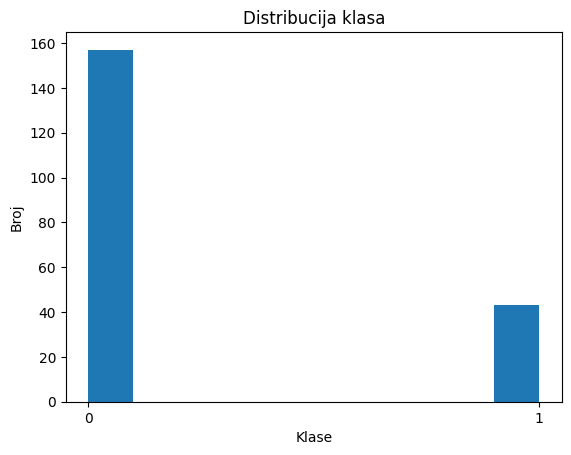

In [1902]:
plt.figure()
plt.hist(y)
plt.xlabel("Klase")
plt.xticks(ticks=[0,1])
plt.ylabel("Broj")
plt.title("Distribucija klasa")
plt.show()

Preskacem koriscenje sklearn-a za **_train_test_split_**. Koristim permutacije za shuffle i pravljenje Train/test podataka

In [1903]:
shuffle = np.random.permutation(X.shape[0])

train_size = int(len(shuffle)) * 0.8 # 80% trening podaci  i 20% test kao u klasicnom train_test_split

train_part = shuffle[:int(train_size)]
test_part = shuffle[int(train_size):]

X_train = X.iloc[train_part]
X_test = X.iloc[test_part]
y_train = y[train_part]
y_test = y[test_part]
print(y_train.value_counts())
y_train = y_train.to_numpy()

Target
0    126
1     34
Name: count, dtype: int64


Skaliranje X upotrebom StandardScaler-a: 

In [1904]:
luka_scaler = Scaler()
luka_scaler.fit(X_train.values)
X_train_scaled = luka_scaler.transform(X_train)
# Fit na trening skupu
# transform sa naucenim parametrima na X_test skupu
X_test_scaled = luka_scaler.transform(X_test)

X_train_scaled = X_train_scaled.to_numpy()
X_test_scaled = X_test_scaled.to_numpy()


Provera dimenzija:

In [1905]:
print(f'X_train, X_test: {X_train_scaled.shape,X_test_scaled.shape}\ny_train, y_test: {y_train.shape,y_test.shape}')
type(X_train_scaled)

X_train, X_test: ((160, 2), (40, 2))
y_train, y_test: ((160,), (40,))


numpy.ndarray

In [1906]:
print(type(X_train_scaled))
print(type(X_train))

<class 'numpy.ndarray'>
<class 'pandas.core.frame.DataFrame'>


Boxplot za jasnu vizuelizaciju skaliranja:

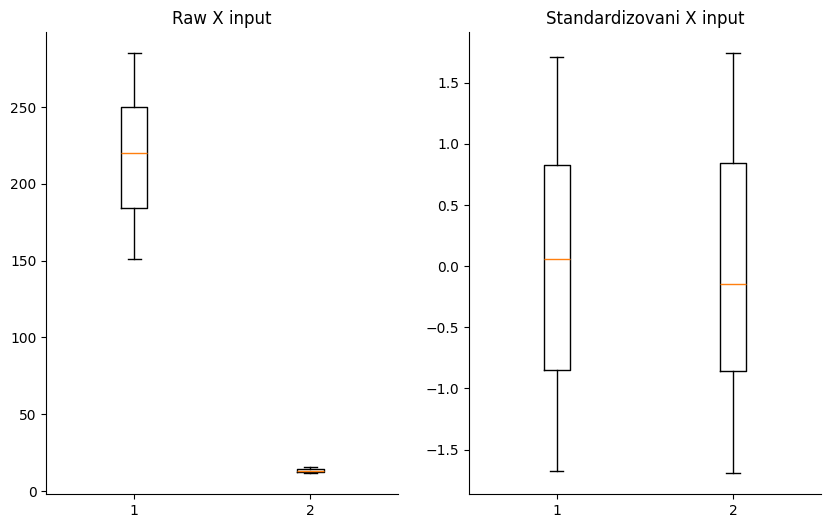

In [1907]:
fig,ax = plt.subplots(1,2,figsize=(10,6))
ax[0].boxplot(X_train,label='Raw X')
ax[1].boxplot(X_train_scaled)
for i in range(len(ax)):
    ax[i].spines[['right','top']].set_visible(False)
ax[0].set_title('Raw X input')
ax[1].set_title('Standardizovani X input')
plt.show()

---

Ideja za arhitekturu modela:

**Dense** slojevi su medjusobno nezavisni - > svaki sloj zasebno inicijalizuje svoje koeficijente na osnovu:

1) input shape-a 

2) broja neurona u sloju


Slojevi se povezuju pomocu **forward** propagacije. Iz **Dense** sloja se dobija Z koji se funkcijom aktivacije prosledjuje sledecem Dense sloju kao **a_in**

- layer1.dense(tensor...) inicijalizacija-> w1,b1 -> Z -> aktivacija -> **forward** - > A2 = A_prev @ W_drugog sloja + b_drugog_sloja


In [1908]:
class Sigmoid:
    def __init__(self):
        pass
    def sigmoid_activate(self,X):
        return 1/(1 + np.exp(-X))
activation = Sigmoid()

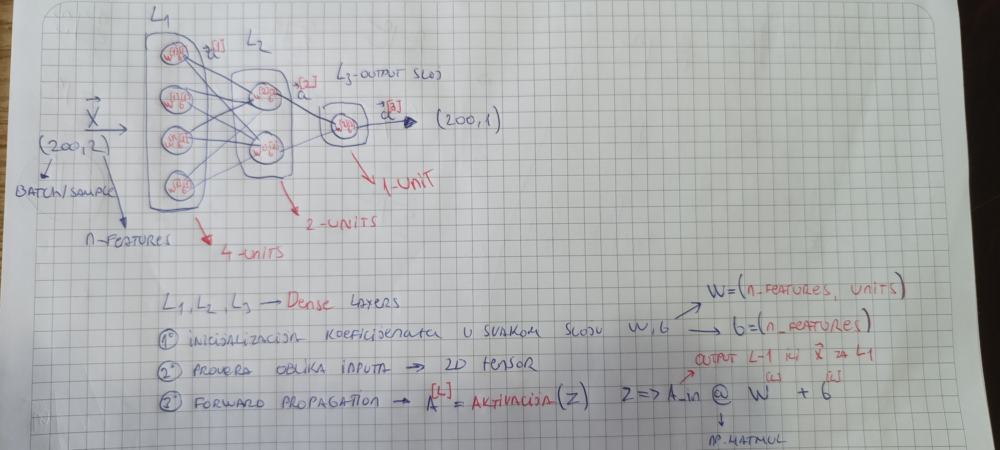

In [1909]:
class layers():
    def __init__(self):
        self.W = None
        self.b = None
        self.A = None
        self.Z = None
        self.A_prev = None
        self.dW = None
        self.db = None

    def Dense(self,input_dim,neurons,activation):
   
        self.activation = activation
        
        # Dodata Xavier/Glorot inicijalizacija za W tezinu
        # Xavier = sqrt(2.0/(fan_in+fan_out)) - > prema literaturi , pri cemu je fan_in = input_dim, fan_out = broj neurona
        # scale

        scale = math.sqrt(2/(input_dim+neurons))

        W = np.random.normal(loc=0,size=(input_dim,neurons)) * scale
        b = np.zeros(neurons) 
    
        self.W = W
        self.b = b

    def forward(self,A_in):

        """
        Propagacija unapred, prvi hidden sloj kao input uzima tensor X i racuna A1
        Sledeci sloj kao input uzima output prethodnog sloja
        
        """

        Z = np.matmul(A_in,self.W) + self.b
        self.Z = Z
        self.A = self.activation.sigmoid_activate(Z)

        self.A_prev = A_in # za racunanje A_out, kao input uzima se output prethodnog sloja tj. A_prev (Za 1. sloj to je 2D tensor trening podataka)

        return self.A
    


#### **Sequential**

U Keras-u, Sequential model predstavlja linearni niz slojeva, pri cemu svaki sloj ima tacno jedan ulazni tensor i jedan izlazni tensor. Moja ideja je bila da ova klasa postavlja strukturu modela, tj. redja slojeve i metodom flow() radi forward pass do y_hat (A3)

U okviru __init__ metode instanciraju se objekti slojeva, kojima se odmah dodeljuju tezine u zavisnosti od dimenzije ulaza i broja neurona u tom sloju.

Parametar verbose dodat je radi lakseg pracenja oblika tenzora tokom pisanja ovog koda, posto sam cesto proveravao .shape vrednosti u razlicitim delovima modela zbog shape missmatch-a koji sam imao nekoliko puta tokom pisanja.

In [1910]:
class Sequential:
    def __init__(self,input_dim,neurons:list,verbose=False):

        self.verbose=verbose
        self.neurons=neurons

        """
            Instantizacija layer objekata

        """
        
        layer_1 = layers()
        layer_2 = layers()  
        layer_3 = layers()

        """
            svaki layer inicijalizuje svoje koeficijente W i b koji se cuvaju kao atribut objekta 
        
        """

        layer_1.Dense(input_dim,neurons[0],activation=activation)
        layer_2.Dense(neurons[0],neurons[1],activation=activation)
        layer_3.Dense(neurons[1],neurons[2],activation=activation)


        self.activation=activation
        self.layers = [layer_1,layer_2,layer_3] #cuvanje slojeva

        if self.verbose:
            print(f"{'-'*35}\nSummary of the model architecture:\nTotal number of layers: {len(list(self.neurons))}\
                \nNumber of neurons per layer: {[neurons[neuron] for neuron in range(len(neurons))]}\
                \nShape of the input data: [batch, {input_dim}]\nActivation function in each layer: {self.activation}\
                \nLayers stored /w coefficients W and b: {[(f'W_{i+1}: {layer.W}',f'b_{i+1}: {layer.b}') for i,layer in enumerate(self.layers)]}\
                \n{'-'*35}")

    def flow(self,a_in):

        """
        flow radi samo forward pass i dobija se A3 odnosno y_pred 
        """
        
        check_shape(a_in) # Proverava da li je input 2D tensor

        A = a_in
        for layer in self.layers:
            A_out = layer.forward(A)
            A = A_out 

        return A_out


**Computational graph** - (backprop.)

J(w,b) -> A^[3] -> Z^[3] -> W^[3] -> b^[3] . . . A^[1] -> Z^[1] -> **W^[1]** -> **b^[1]**

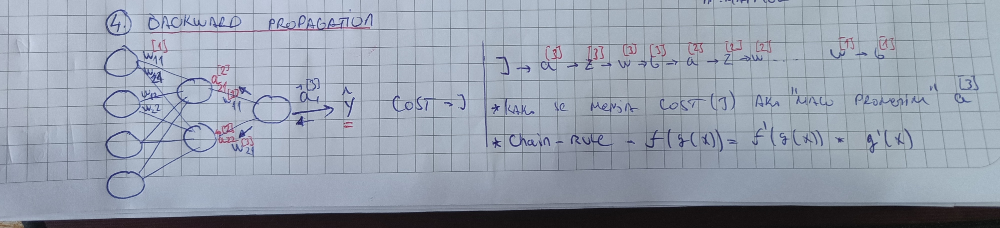

---

#### **Backpropagation**

Backpropagation se koristi za ažuriranje tezina u neuronskoj mrezi. Njegova uloga je da prilagodi tezine tako da se minimizuje loss funkcija (odnosno __Cost__ za ceo dataset).

Kako bih utvrdio doprinos svakog parametra modela u ukupnoj gresci, racunam parcijalne izvode loss funkcije za svaku tezinu

Moja pocetna ideja bila je da implementiram backprop metodu unutar klase layers().

Za azuriranje novih tezina, nakon racunanja gradijenta, koristim sacuvane parametre u okviru svakog od slojeva.


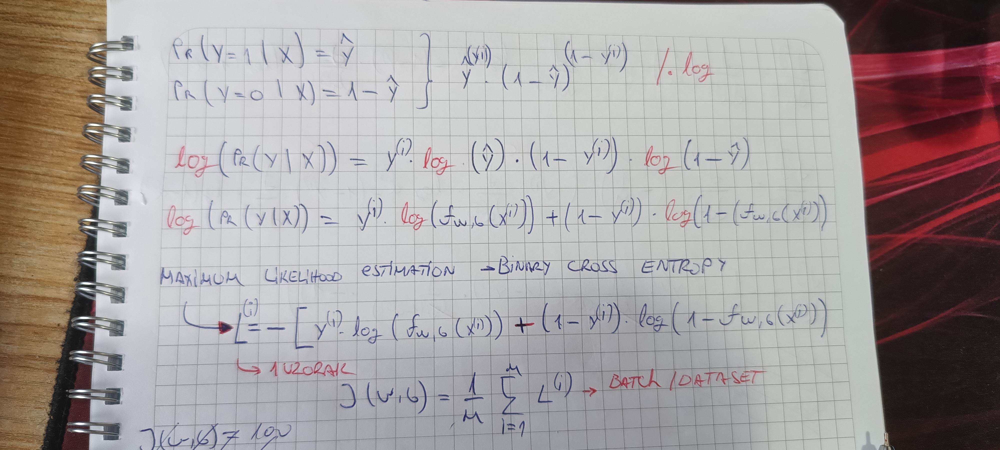

In [1911]:
class Model:
    def __init__(self,model):
        self.model = model
        self.model_layers = model.layers
    def fit(self,X,y,epochs:int,alpha): #ulaz X-train,y_train , broj epoha i learning-rate
        m,_ = X.shape
        self.m = m

        # y shape (m,)
        y = check_y_shape(y)

        """
            iteracija kroz jednu epohu treniranja modela:
            1. Ceo dataset prolazi kroz forward pass, racuna se cost
            2. Backward pass racuna gradijente i azurira tezine
            3. cuvam cost u history=[] listi

        """        

        history=[] 

        for epoch in range(1,epochs+1):

            cost = Cost()
            A_out = self.model.flow(X)

            current_cost = cost.get_cost(A_out,y) 
            history.append({'Epoch':epoch,'Current cost':current_cost,})


            # Pristupanje sacuvanim W i B kroz layer.W i layer.b       
     
            # Implementiram jos jednu petlju kako bih vrsio iteraciju od poslednjeg do prvog sloja i izbegao hard-codovanje derivata
            # Unutrasnja petlja vrsi iteraciju od 3. -> 1. sloja i racuna parcijalne izvode respektivno od [dW3 db3] do [dW1 db1]
            # uniformno obelezavanje dW i db kroz sve slojeve
   
            for j,layer in enumerate(self.model_layers[::-1]):

                if j ==0: # 3. sloj 

                    dZ = -(1/m) * ((y / A_out) - ((1 - y) / (1 - A_out))) * (np.exp(layer.Z) / (1 + np.exp(layer.Z))**2)
                    dW= np.matmul(layer.A_prev.T,dZ)
                    db =np.sum(dZ,axis=0)
                    dA = np.matmul(dZ,layer.W.T) 
                    A = layer.A_prev
                    
                    layer.dW = dW
                    layer.db = db

                elif j == 1: # 2. sloj

                    dZ = dA * A*(1-A)
                    dW = np.matmul(layer.A_prev.T,dZ) 
                    db =np.sum(dZ,axis=0)
                    dA = np.matmul(dZ,layer.W.T)
                    A = layer.A_prev

                    layer.dW = dW
                    layer.db = db 

                else:

                    dZ = dA * A*(1 - A)
                    dW = np.matmul(layer.A_prev.T,dZ)
                    db = np.sum(dZ,axis=0)
                    dA = np.matmul(dZ,layer.W.T)

                    layer.dW = dW
                    layer.db = db
   
            """
            Iteracijom kroz 3 sloja, izvlacim sacuvane derivacije i radim azuriranje W i b
            """
            
            for layer in self.model_layers:
                layer.W = layer.W - alpha * layer.dW
                layer.b = layer.b - alpha * layer.db

            A_out = self.model.flow(X) # odradjen forward pass, dobijen je A^[3] tj. y_pred
            new_cost = cost.get_cost(A_out,y) #Cost izracunat sa azuriranim koeficijentima

            if abs(new_cost - current_cost) < 1 * np.exp(-6): # Convergence break, ako nema smanjenja Cost-a za vise od 10^-6
                print(f"Zaustavljanje algoritma na Epohi br. {epoch}\nSmanjenje gradijenta manje od 1*10^-6")
                print(f"Cuvanje najboljih tezina iz slojeva...")
                break
        return history

    def predict(self,X): #Predikcija iskljucivo na test podacima
        
        #Za predikciju koristim tezine W i b, koje su dale najmanji Cost
        #U ovakvoj postavci, to su tezine iz poslednjeg cost-a
    
        return self.model.flow(X)
        
        

---

### Testiranje:

In [1912]:
builder = Sequential(X_train_scaled.shape[-1],[4,2,1],verbose=True)

-----------------------------------
Summary of the model architecture:
Total number of layers: 3                
Number of neurons per layer: [4, 2, 1]                
Shape of the input data: [batch, 2]
Activation function in each layer: <__main__.Sigmoid object at 0x0000022E842656D0>                
Layers stored /w coefficients W and b: [('W_1: [[ 1.10882263 -0.10717417 -0.1170705   0.05486735]\n [-0.15008426  0.50278539  0.58120314  0.49361233]]', 'b_1: [0. 0. 0. 0.]'), ('W_2: [[ 0.56752899 -0.63623111]\n [ 1.45931122  1.0519562 ]\n [ 0.4126142  -0.09262308]\n [-0.33694096  0.96924928]]', 'b_2: [0. 0.]'), ('W_3: [[-0.48198821]\n [ 0.86523063]]', 'b_3: [0.]')]                
-----------------------------------


In [1913]:
model_test = Model(builder)
history = model_test.fit(X_train_scaled,y_train,epochs=1000000,alpha=0.25)
for i in history:
    print(i)
print(f"Prva epoha: {history[0]['Current cost']}")
print(f"Poslednja epoha: {history[-1]['Current cost']}")
y_proba = model_test.predict(X_test_scaled)
y_pred = (y_proba>=0.5).astype(int)

Zaustavljanje algoritma na Epohi br. 14
Smanjenje gradijenta manje od 1*10^-6
Cuvanje najboljih tezina iz slojeva...
{'Epoch': 1, 'Current cost': np.float64(0.7610959064110949)}
{'Epoch': 2, 'Current cost': np.float64(0.7042323841600222)}
{'Epoch': 3, 'Current cost': np.float64(0.6612277673714639)}
{'Epoch': 4, 'Current cost': np.float64(0.6286317486873743)}
{'Epoch': 5, 'Current cost': np.float64(0.6038104560634132)}
{'Epoch': 6, 'Current cost': np.float64(0.5847964619115459)}
{'Epoch': 7, 'Current cost': np.float64(0.5701351656846816)}
{'Epoch': 8, 'Current cost': np.float64(0.5587541978840879)}
{'Epoch': 9, 'Current cost': np.float64(0.5498615720149561)}
{'Epoch': 10, 'Current cost': np.float64(0.5428696898543953)}
{'Epoch': 11, 'Current cost': np.float64(0.5373398963361637)}
{'Epoch': 12, 'Current cost': np.float64(0.5329424337062937)}
{'Epoch': 13, 'Current cost': np.float64(0.5294275972104606)}
{'Epoch': 14, 'Current cost': np.float64(0.5266049232866717)}
Prva epoha: 0.7610959064

In [1914]:
print(f"Predikcije modela: {y_pred.ravel()}")
print(f"Test podaci: {y_test.ravel()}")

Predikcije modela: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0]
Test podaci: [1 1 0 0 1 0 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0]


C:\Users\Admin\AppData\Local\Temp\ipykernel_1164\1908317792.py:2: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  print(f"Test podaci: {y_test.ravel()}")


In [1915]:
print(f"Prikaz y_proba:\nmin_proba: {y_proba.min()}\nmax_proba: {y_proba.max()}\navg_proba: {y_proba.mean()}")

Prikaz y_proba:
min_proba: 0.25940927743959974
max_proba: 0.28336101073189285
avg_proba: 0.26994075956077157


Model i dalje daje skoro konstantnu verovatnocu za sve uzorke

In [1916]:
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_curve,roc_curve

In [1917]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.78      1.00      0.87        31
           1       0.00      0.00      0.00         9

    accuracy                           0.78        40
   macro avg       0.39      0.50      0.44        40
weighted avg       0.60      0.78      0.68        40



c:\Users\Admin\ML\venv1\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\ML\venv1\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\Admin\ML\venv1\Lib\site-packages\sklearn\metrics\_classification.py:1833: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


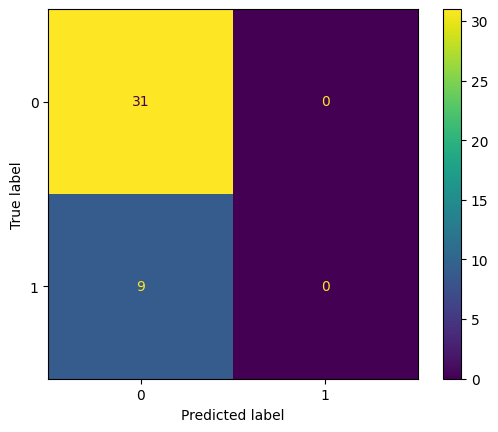

In [1918]:
cm = confusion_matrix(y_test,y_pred)
display_cm = ConfusionMatrixDisplay(cm,display_labels=[0,1])
display_cm.plot()

#### Racunanje nekoliko pocetnih izvoda: 
- u svesci pise 'J' ali sam mislio na Cost funkciju

#### 1. dC/da^[3]

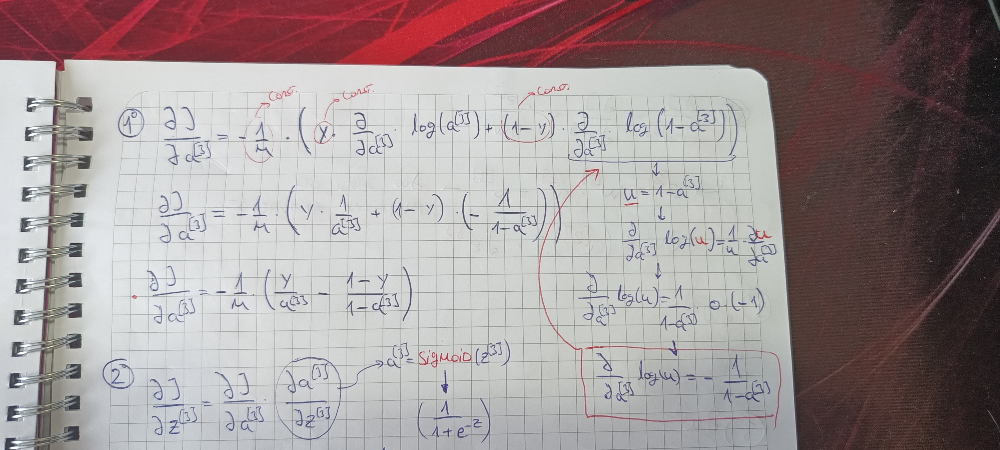

#### 2. dC/dz^[3]

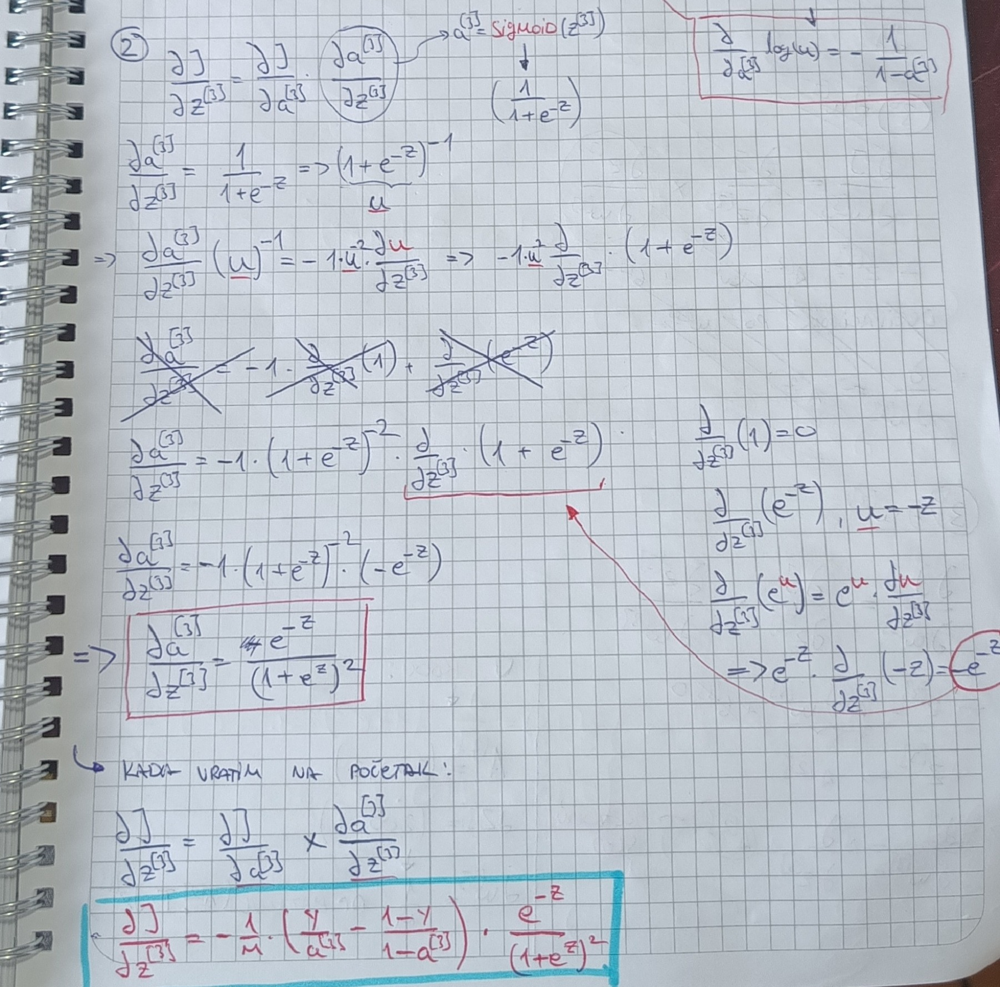

#### 3. dC/dw^[3]:

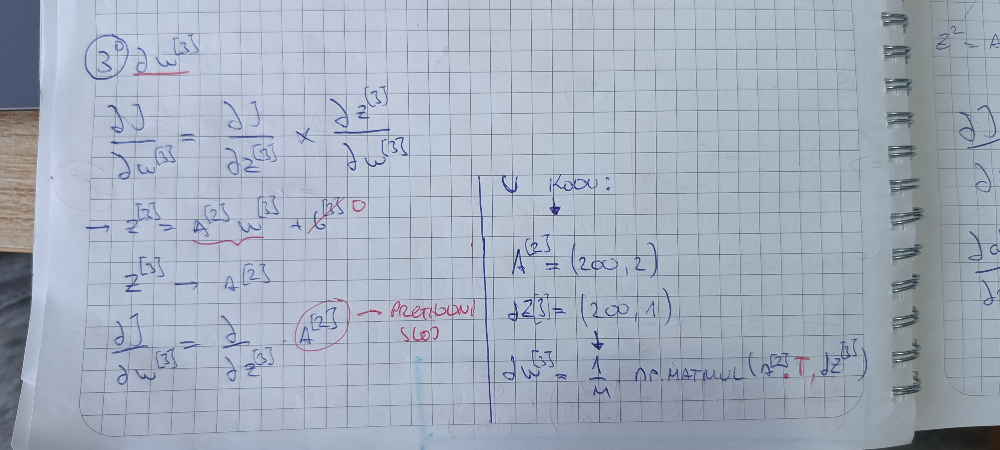

#### 4. dZ^[2]:


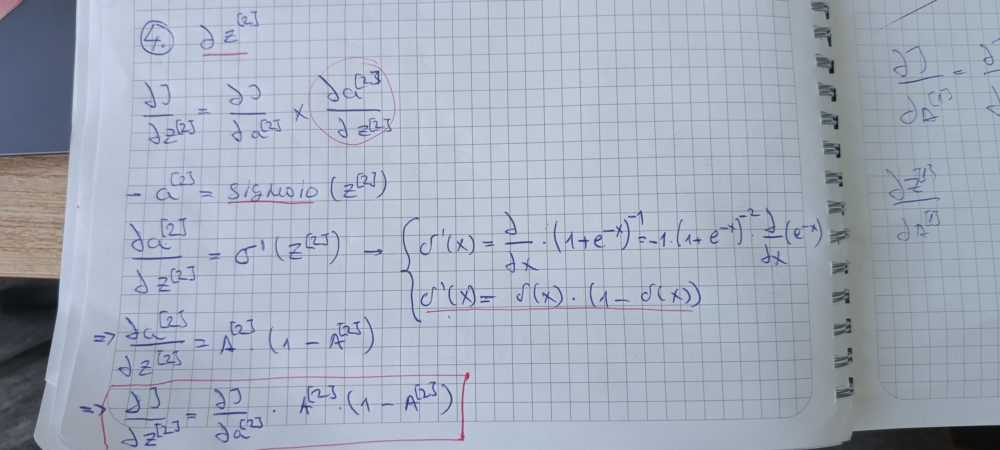

---

### Uoceni problemi i moj pristup optimizacije:

#### Dodatne izmene koje su uticale na optimizaciju smanjivanja Cost funckije kao i resavanje problema slicnih verovatnoca predikcija:

#### 1) __Xavier/Glorot__ inicijalizacija za **W** tezinu 

- metod je znacajan pri koriscenju aktivacione funkcije poput _Sigmoid_-a, _tanh_-a.

- skaliranje W omogucava zadrzavanje varijanse A_out (A1, A2 i A3) kroz slojeve

- prema tome, varijansa gradijenata takodje ostaje slicna tokom propagacije unazad

Na ovom link-u [https://apxml.com/courses/introduction-to-deep-learning/chapter-5-building-training-dnns/weight-initialization] sam pronasao znacajne informacije vezano za generalnu inicijalizaciju koeficijenata kao i dobre i lose strane razlicith metoda. U ovom projektu incijalno, __W__ je instantiziran sa normalnom raspodelom i malom standardnom devijacijom.
Ovakav pristup smanjuje sansu za prevremenom saturacijom gradijenta, ali ukoliko su nasumicne vrednosti veoma male, varijansa izlaza (A) se moze znacajno smanjiti. Ovo predstavlja problem pogotovo kod dubokih mreza sa vecim brojem slojeva. Nisam siguran da li je to ovde direktno uticalo na smanjenje gradijenta.





#### 2) Pri veoma maloj stopi ucenja, konvergencija nastupa veoma brzo (<5 epoha)

Moje misljenje je da ovakvo ponasanje modela sugerise da je model zastao u lokalnom minimumu ili regionu sedla. 
Pristup koji sam testirao za prevazilazenje ovakvog problema jeste povecanje _alpha_ koje zaista dovodi do daljeg smanjena _Cost_ funkcije. 

#### 3) Svaka predikcija modela daje veoma slicne verovatnoce (y_proba)

Pre Xavier/Glorot skaliranja, _Y pred_ verovatnoce bile su gotovo iste sa razlikom u 5. i 6. decimali. Pre same inicijalizacije skalirao sam _X trening_ set sa StandardScaler-om koji sam rucno implementirao u pomocnom .py fajlu (_luka-plugins.py_). Ovo nije resilo problem.

Trenutno verovatnoce predikcije su i dalje veoma slicnh vrednosti, ali nesto bolje nakon Xavier inicijalizacije.

In [1919]:
print(f"Prikaz y_proba:\nmin_proba: {y_proba.min()}\nmax_proba: {y_proba.max()}\navg_proba: {y_proba.mean()}")

Prikaz y_proba:
min_proba: 0.25940927743959974
max_proba: 0.28336101073189285
avg_proba: 0.26994075956077157


#### 4) Model ne razdvaja klase, verovatnoce su i dalje u jako uskom opsegu vrednosti pri cemu je predikcija zasnovana na vecinskoj klasi

---

### **Jednostavniji model**:

#### Za ovo testiranje brisem 1 skriveni sloj iz klase _Sequential_ kako bih isprobao model sa 1 dense slojem. Sve ostalo ostaje isto.


In [1920]:
class Sequential:
    def __init__(self,input_dim,neurons:list,verbose=False):

        self.verbose=verbose
        self.neurons=neurons

        """
            Instantizacija layer objekata

        """
        
        layer_1 = layers()
        layer_2 = layers()  
        # Obrisan 3. sloj za ovo testiranje
        

        """
            svaki layer inicijalizuje svoje koeficijente W i b koji se cuvaju kao atribut objekta 
        
        """

        layer_1.Dense(input_dim,neurons[0],activation=activation)
        layer_2.Dense(neurons[0],neurons[1],activation=activation)
        


        self.activation=activation
        self.layers = [layer_1,layer_2] #cuvanje slojeva

        if self.verbose:
            print(f"{'-'*35}\nSummary of the model architecture:\nTotal number of layers: {len(list(self.neurons))}\
                \nNumber of neurons per layer: {[neurons[neuron] for neuron in range(len(neurons))]}\
                \nShape of the input data: [batch, {input_dim}]\nActivation function in each layer: {self.activation}\
                \nLayers stored /w coefficients W and b: {[(f'W_{i+1}: {layer.W}',f'b_{i+1}: {layer.b}') for i,layer in enumerate(self.layers)]}\
                \n{'-'*35}")

    def flow(self,a_in):

        """
        flow radi samo forward pass i dobija se A3 odnosno y_pred 
        """
        
        check_shape(a_in) # Proverava da li je input 2D tensor

        A = a_in
        for layer in self.layers:
            A_out = layer.forward(A)
            A = A_out 

        return A_out


#### Mreza od 2 sloja 

- Skriveni sloj - 2 neurona

- Output sloj - 1 neuron

In [1921]:
builder_simple = Sequential(X_train_scaled.shape[-1],neurons=[2,1],verbose=True)

-----------------------------------
Summary of the model architecture:
Total number of layers: 2                
Number of neurons per layer: [2, 1]                
Shape of the input data: [batch, 2]
Activation function in each layer: <__main__.Sigmoid object at 0x0000022E842656D0>                
Layers stored /w coefficients W and b: [('W_1: [[ 0.9484237   0.75200661]\n [ 0.30874026 -0.79106323]]', 'b_1: [0. 0.]'), ('W_2: [[-0.81737499]\n [ 1.39646483]]', 'b_2: [0.]')]                
-----------------------------------


In [1922]:
model_simple = Model(builder_simple)

model_simple.fit(X_train_scaled,y_train,epochs=1000,alpha=0.025)

Zaustavljanje algoritma na Epohi br. 39
Smanjenje gradijenta manje od 1*10^-6
Cuvanje najboljih tezina iz slojeva...


[{'Epoch': 1, 'Current cost': np.float64(0.7614259094273584)},
 {'Epoch': 2, 'Current cost': np.float64(0.7561787118034382)},
 {'Epoch': 3, 'Current cost': np.float64(0.7510343601214304)},
 {'Epoch': 4, 'Current cost': np.float64(0.7459909921270369)},
 {'Epoch': 5, 'Current cost': np.float64(0.74104676553156)},
 {'Epoch': 6, 'Current cost': np.float64(0.7361998585913658)},
 {'Epoch': 7, 'Current cost': np.float64(0.7314484706382217)},
 {'Epoch': 8, 'Current cost': np.float64(0.7267908225619547)},
 {'Epoch': 9, 'Current cost': np.float64(0.7222251572469186)},
 {'Epoch': 10, 'Current cost': np.float64(0.7177497399637942)},
 {'Epoch': 11, 'Current cost': np.float64(0.7133628587182778)},
 {'Epoch': 12, 'Current cost': np.float64(0.7090628245582357)},
 {'Epoch': 13, 'Current cost': np.float64(0.7048479718409126)},
 {'Epoch': 14, 'Current cost': np.float64(0.7007166584617949)},
 {'Epoch': 15, 'Current cost': np.float64(0.6966672660467239)},
 {'Epoch': 16, 'Current cost': np.float64(0.6926982

In [1923]:
y_proba = model_simple.predict(X_test_scaled)
y_pred = (y_proba>=0.5).astype(int)

In [1924]:
print(f"Prikaz y_proba:\nmin_proba: {y_proba.min()}\nmax_proba: {y_proba.max()}\navg_proba: {y_proba.mean()}")

Prikaz y_proba:
min_proba: 0.3497083522287223
max_proba: 0.5581135876534672
avg_proba: 0.46205935856548785


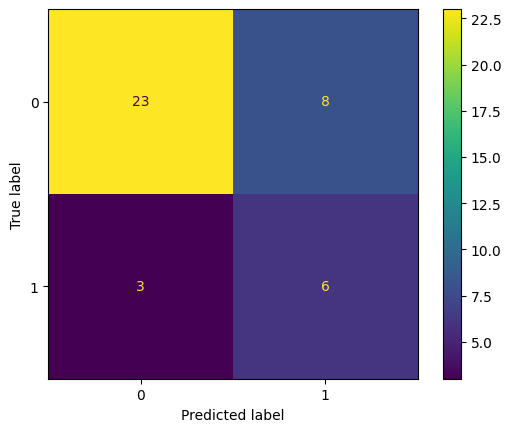

In [1925]:
ConfusionMatrixDisplay.from_predictions(y_test,y_pred)

In [1926]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.88      0.74      0.81        31
           1       0.43      0.67      0.52         9

    accuracy                           0.72        40
   macro avg       0.66      0.70      0.66        40
weighted avg       0.78      0.72      0.74        40



##### Metrika tacnosti nije relevantna u ovakvoj postavci projekta s obzirom da model moze imati jako visoku tacnost pri predikciji samo vecinske klase.

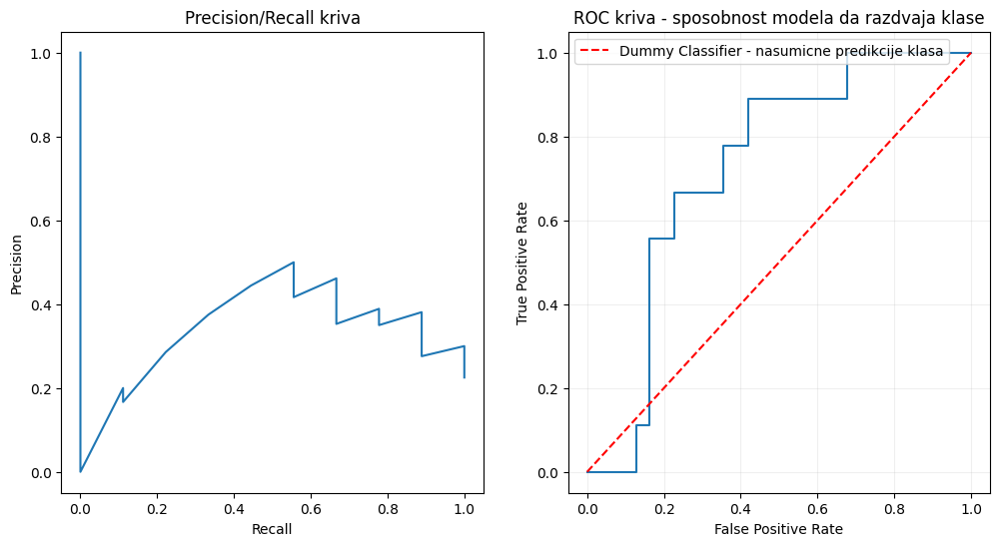

In [1927]:
tn,fp,fn,tp = confusion_matrix(y_test,y_pred).ravel()

#recall = tp / (tp+fn)
#precision = tp / (tp+fp)

precision,recall,threshold = precision_recall_curve(y_test,y_proba)
false_positives_rate, true_positives_rate, thresholds = roc_curve(y_test,y_proba)

fig,ax = plt.subplots(1,2,figsize=(12,6))
ax[0].plot(recall,precision)
ax[0].set_title('Precision/Recall kriva')
ax[0].set_ylabel('Precision')
ax[0].set_xlabel('Recall')
ax[1].plot(false_positives_rate,true_positives_rate)
ax[1].plot((0,1),(0,1),linestyle='--',color='red',label='Dummy Classifier - nasumicne predikcije klasa')
ax[1].set_title('ROC kriva - sposobnost modela da razdvaja klase')
ax[1].set_ylabel('True Positive Rate')
ax[1].set_xlabel('False Positive Rate')
plt.legend()
plt.grid(alpha=.2)
plt.show()




Kao dodatnu proveru koristim jednostavan linearni model logisticke regresije:

In [1928]:
from sklearn.linear_model import LogisticRegression


mod = LogisticRegression()
mod.fit(X_train_scaled,y_train)
y_proba = mod.predict_proba(X_test_scaled)
print(y_proba[:,1])

[0.27198989 0.33039142 0.13333805 0.11080053 0.35178737 0.16603736
 0.1702548  0.13975391 0.31533218 0.10353759 0.35315481 0.09764476
 0.05329843 0.36093817 0.30676202 0.36354053 0.23279567 0.22168745
 0.24767095 0.22015704 0.10226369 0.14755745 0.22747543 0.42933936
 0.19883149 0.07424058 0.05042651 0.50563264 0.31331716 0.06458478
 0.08670685 0.4283401  0.03876418 0.44767146 0.06822064 0.28472857
 0.32764188 0.08897999 0.26125502 0.1106812 ]


In [1929]:
y_pred_logreg = (y_proba[:,1]>=0.5).astype(int)
print(y_pred_logreg)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0]


In [1930]:
print(classification_report(y_test,y_pred_logreg))

              precision    recall  f1-score   support

           0       0.77      0.97      0.86        31
           1       0.00      0.00      0.00         9

    accuracy                           0.75        40
   macro avg       0.38      0.48      0.43        40
weighted avg       0.60      0.75      0.66        40



In [1931]:
confusion_matrix(y_test, y_pred_logreg)

array([[30,  1],
       [ 9,  0]])

Pri standardnom pragu odlucivanja od 0.5 model klasifikuje uzorke uglavnom kao vecinsku klasu. U poredjenju sa jednostavnim MLP modelom, MLP model pokazuje bolje ponasanje u vidu predvidjanja manjinske klase 1. Ovo sugerise da neuronska mreza uspesnije hvata obrasce koji su vezani za manjinsku klasu.

---

#### Zakljucak:

Na ovom datasetu i u okviru trenutne implementacije, model sa jednim skrivenim slojem pokazao se uspesnijim od dubljeg modela, jer je uspevao da prepozna deo uzoraka pozitivne klase, dok se dublji model uglavnom svodio na predikciju vecinske klase.

Problem klasnog disbalansa kod **Multilayer Perceptron** modela zabelezen je i u literaturi, gde se navodi da doprinos gradijenta uglavnom potice od  vecinske klase, pri cemu dolazi do smanjenja greske vecinske klase u pocetnim iteracijama. Referenca ( https://link.springer.com/article/10.1007/s10994-022-06268-8 )

Takodje, u studiji Murphey et al. (2004) **(Neural learning from unbalanced data. Applied Intelligence, 21(2), 117–128.)** u kojoj je ispitivana osetljivost razdvajanja klasa na tri razlicite arhitekture mreza, ukljucujuci i **MLP** (troslojni perceptron sa slojevima 5-4-4-1), prikazano je da je na performanse klasifikacije znacajno uticala upravo klasna neuravnotezenost. Model je sa visokom preciznoscu predvidjao vecinsku klasu, dok je veoma slabo predvidjao klasu u manjini.


U realnom projektu koristio bih metode kao sto su stratifikovani train test split ili neku od resampling tehnika kao sto je resampling manjinske klase (**SMOTE**)